
image 1/1 C:\Users\Griffin Synnott\grocerystore.jpg: 512x640 1 person, 1 backpack, 1 bottle, 2 laptops, 586.7ms
Speed: 0.0ms preprocess, 586.7ms inference, 0.0ms postprocess per image at shape (1, 3, 512, 640)


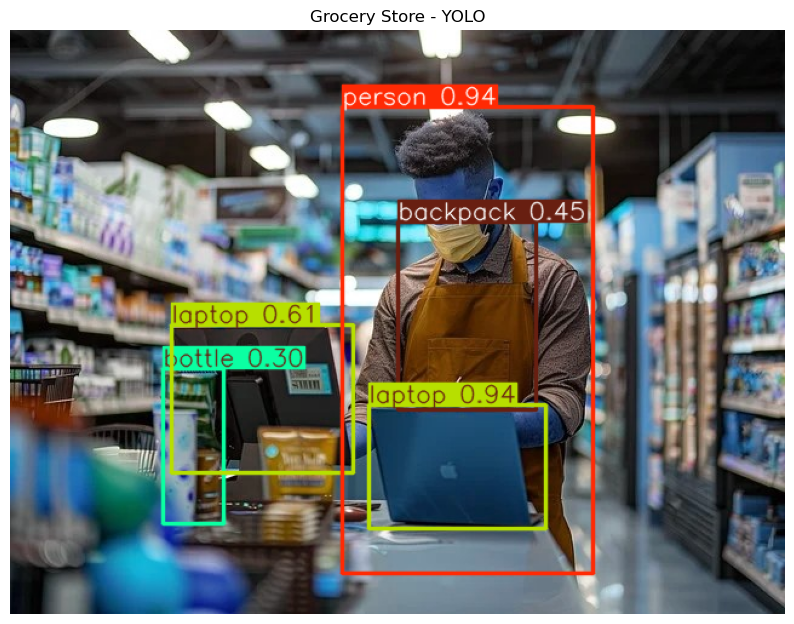

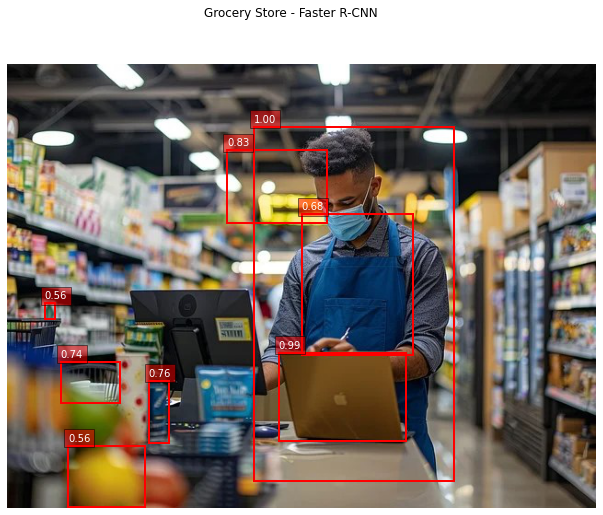


image 1/1 C:\Users\Griffin Synnott\barbershop.jpg: 448x640 4 persons, 773.9ms
Speed: 0.0ms preprocess, 773.9ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)


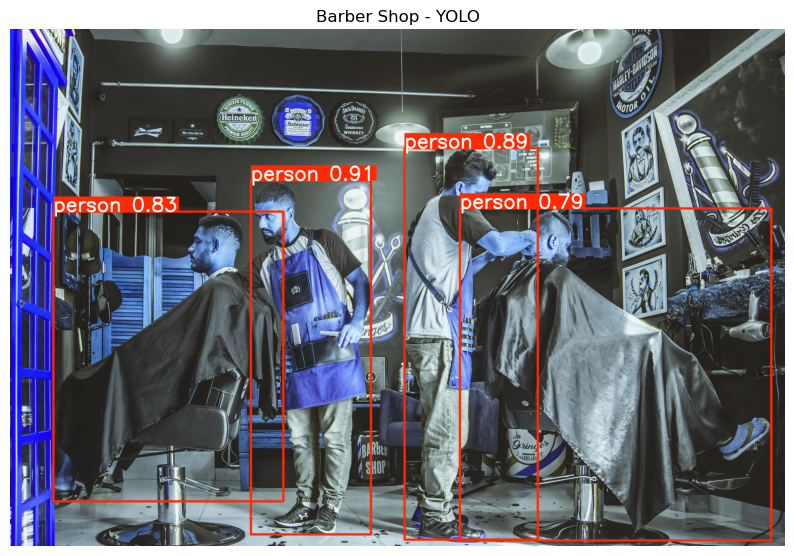

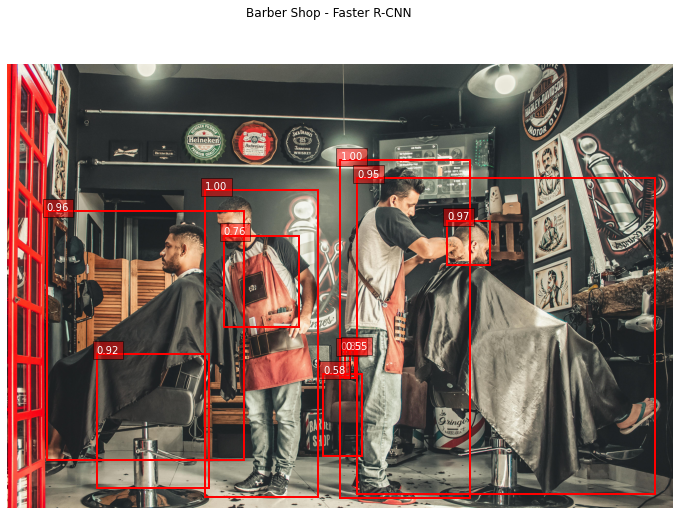


image 1/1 C:\Users\Griffin Synnott\airport.jpg: 448x640 2 persons, 1 backpack, 1 handbag, 3 suitcases, 2 tvs, 792.1ms
Speed: 4.1ms preprocess, 792.1ms inference, 6.6ms postprocess per image at shape (1, 3, 448, 640)


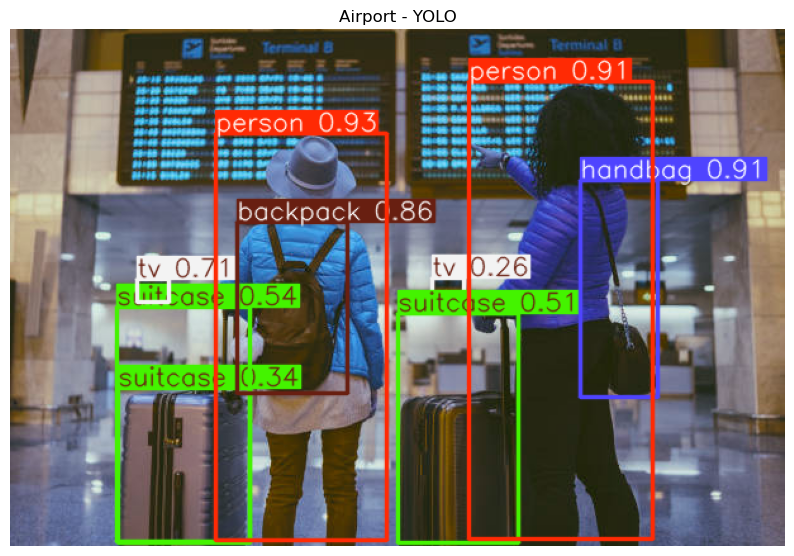

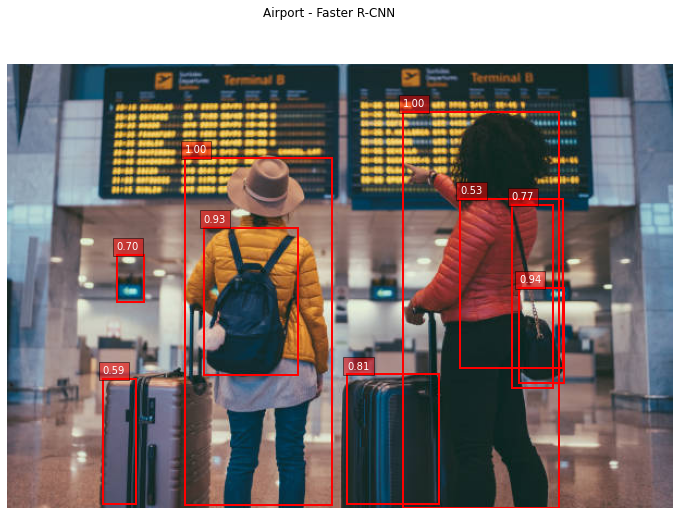


image 1/1 C:\Users\Griffin Synnott\gym.jpg: 384x640 2 motorcycles, 1 couch, 788.9ms
Speed: 2.4ms preprocess, 788.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)


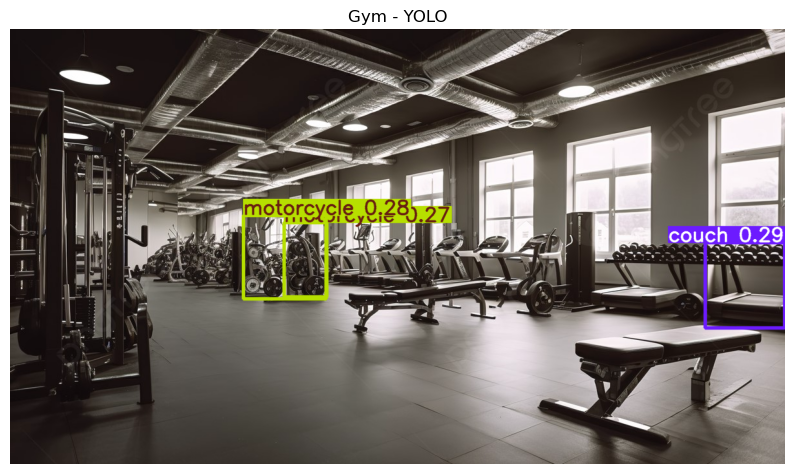

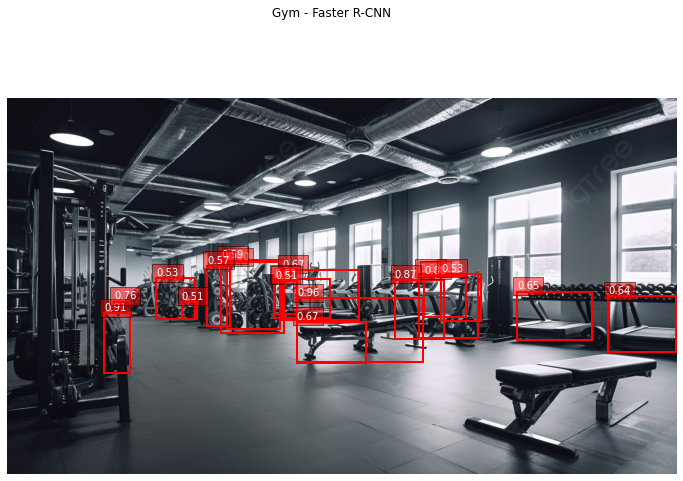


image 1/1 C:\Users\Griffin Synnott\microsoftstore.jpg: 416x640 12 persons, 829.0ms
Speed: 3.3ms preprocess, 829.0ms inference, 4.4ms postprocess per image at shape (1, 3, 416, 640)


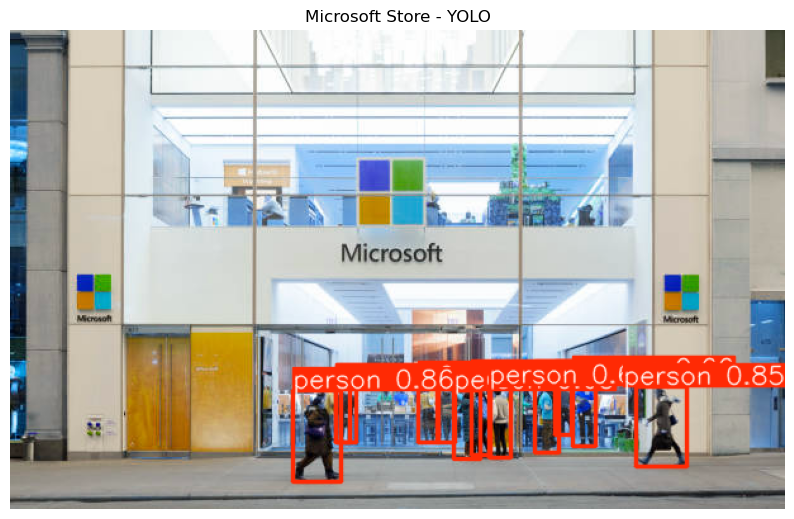

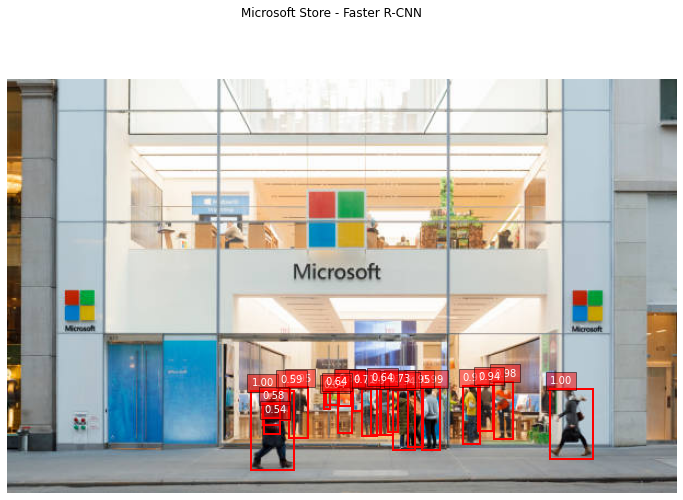


image 1/1 C:\Users\Griffin Synnott\artstudio.jpg: 384x640 1 chair, 5 potted plants, 968.0ms
Speed: 15.6ms preprocess, 968.0ms inference, 15.7ms postprocess per image at shape (1, 3, 384, 640)


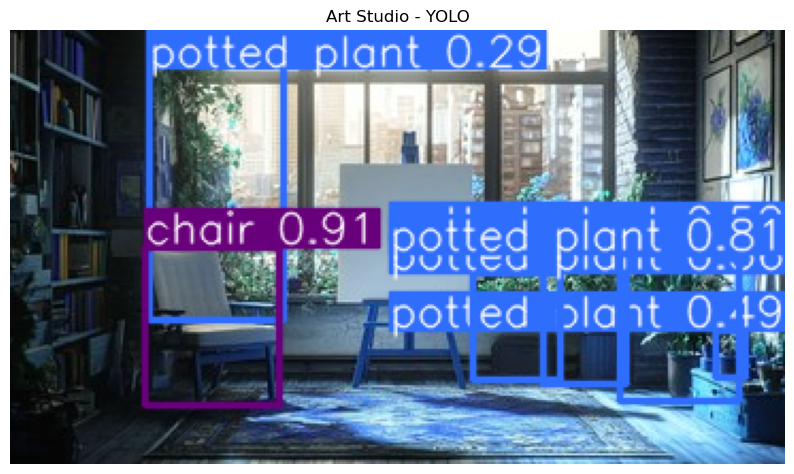

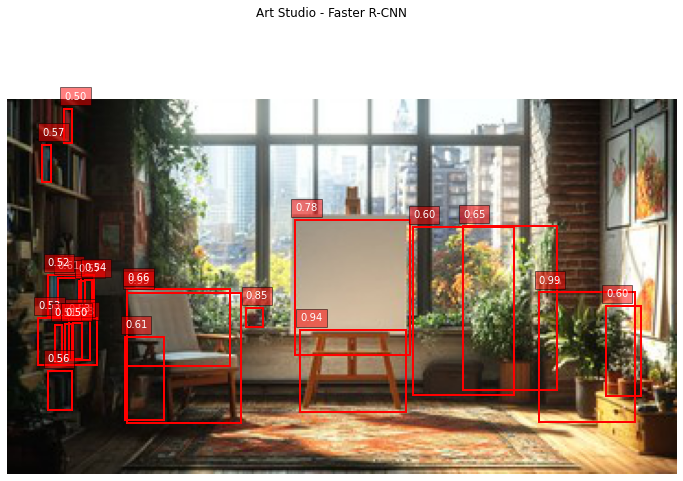


image 1/1 C:\Users\Griffin Synnott\cardealership.jpg: 448x640 14 cars, 1 truck, 902.7ms
Speed: 17.3ms preprocess, 902.7ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)


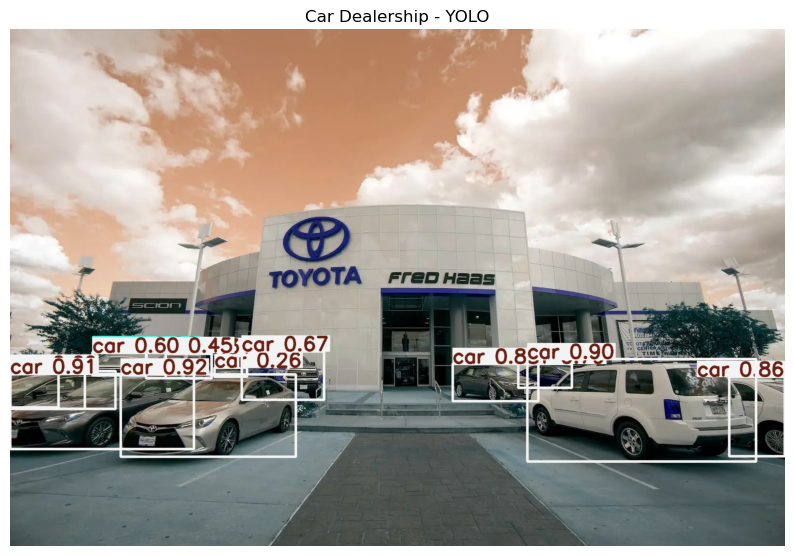

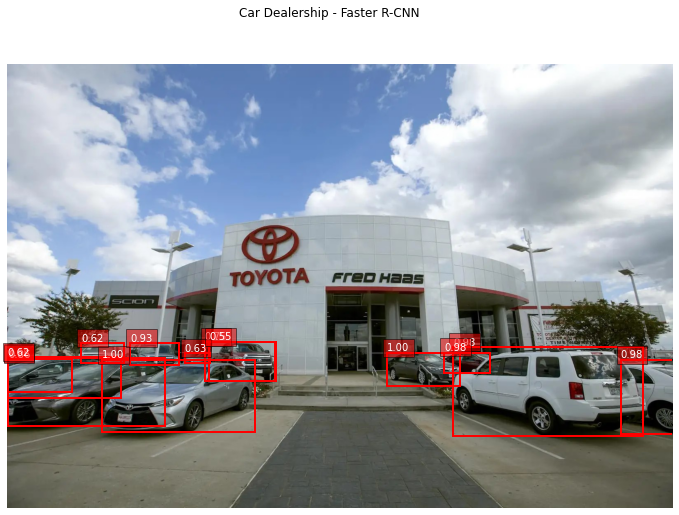


image 1/1 C:\Users\Griffin Synnott\foodcourt.jpg: 448x640 12 persons, 1 handbag, 1 bottle, 1 cup, 1 bowl, 7 chairs, 3 dining tables, 822.8ms
Speed: 6.1ms preprocess, 822.8ms inference, 0.0ms postprocess per image at shape (1, 3, 448, 640)


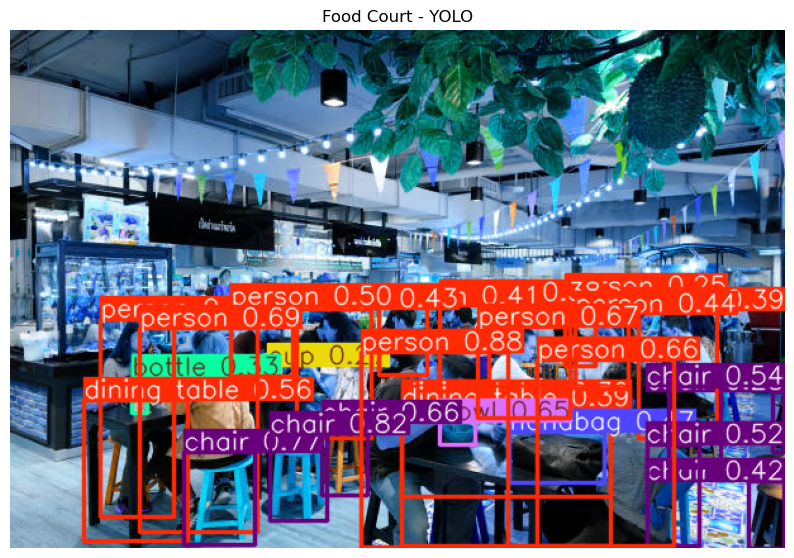

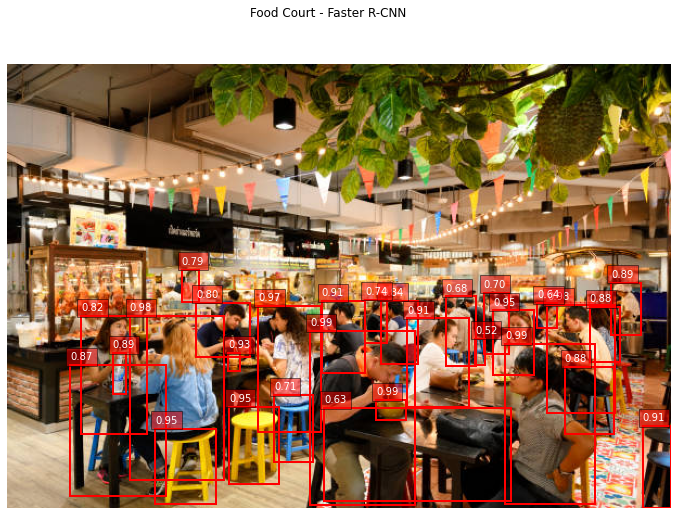


image 1/1 C:\Users\Griffin Synnott\factory.jpg: 448x640 (no detections), 924.3ms
Speed: 0.0ms preprocess, 924.3ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


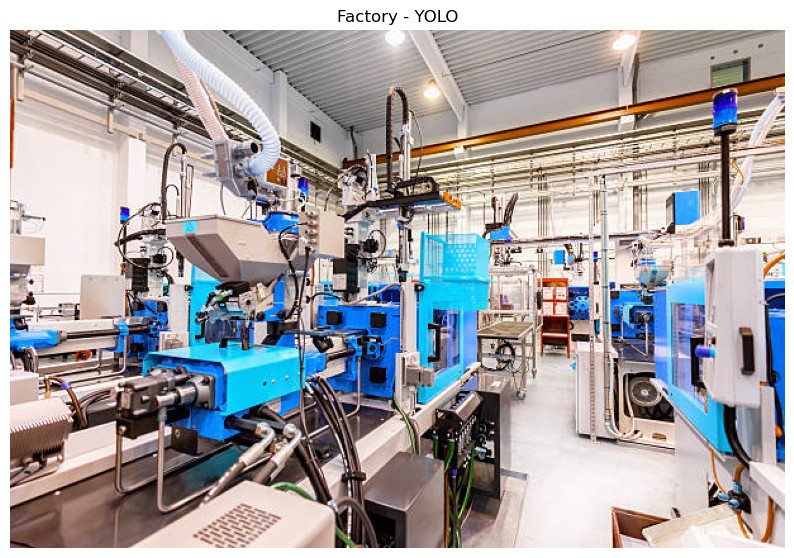

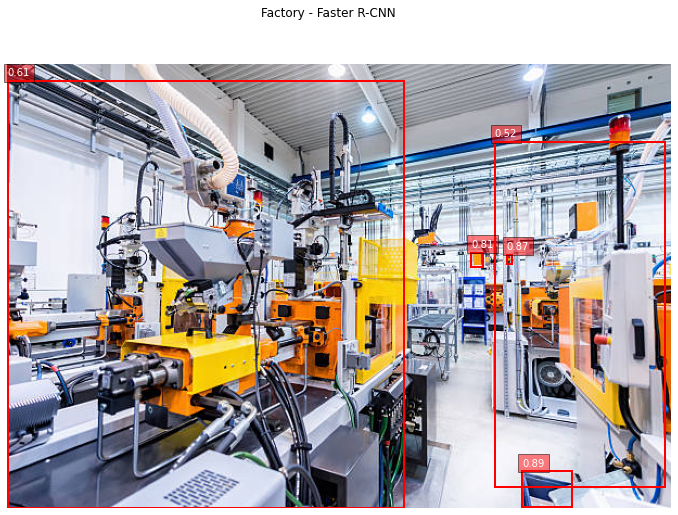


image 1/1 C:\Users\Griffin Synnott\gasstation.jpg: 448x640 2 cars, 1 truck, 1295.3ms
Speed: 13.5ms preprocess, 1295.3ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)


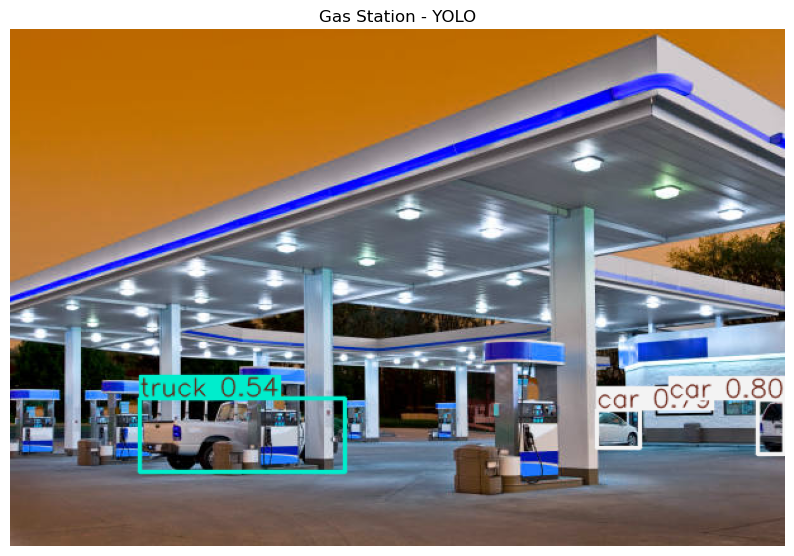

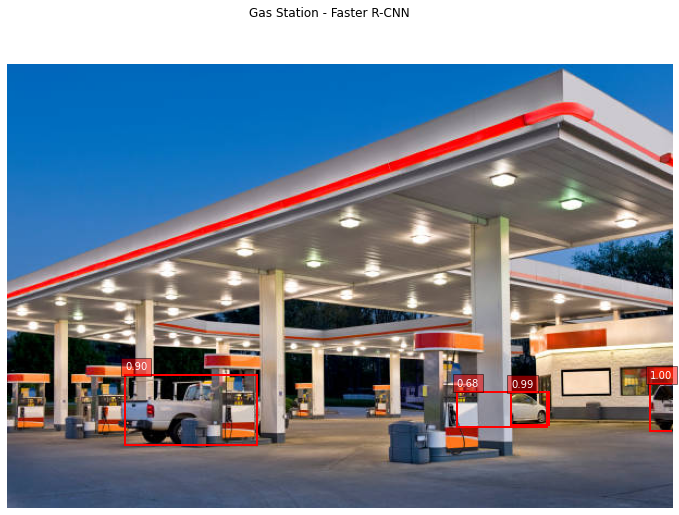

In [7]:
import time
from ultralytics import YOLO
from PIL import Image
import matplotlib.pyplot as plt
import torch
import torchvision.transforms.functional as F
import torchvision.models.detection as detection
import matplotlib.patches as patches
import pandas as pd

# Analyze each image
for name, path in image_paths.items():
    # YOLO
    yolo_objects, yolo_avg_prob, yolo_time, yolo_image = analyze_with_yolo(path)
    results.append([name, "YOLO", yolo_objects, yolo_avg_prob, yolo_time])
    
    # Display YOLO results
    plt.figure(figsize=(10, 10))
    plt.title(f"{name} - YOLO")
    plt.imshow(yolo_image)
    plt.axis("off")
    plt.show()
    
    # Faster R-CNN
    rcnn_objects, rcnn_avg_prob, rcnn_time, rcnn_fig = analyze_with_faster_rcnn(path)
    results.append([name, "Faster R-CNN", rcnn_objects, rcnn_avg_prob, rcnn_time])
    
    # Display Faster R-CNN results
    rcnn_fig.suptitle(f"{name} - Faster R-CNN")
    plt.show()

# Create a DataFrame for the results table
columns = ["Image", "Method", "# Objects Detected", "Average Probability", "Analysis Time (s)"]
results_df = pd.DataFrame(results, columns=columns)

# Display the results table in a visually appealing format
def highlight_max(s):
    """Highlight the maximum values in a Series."""
    is_max = s == s.max()
    return ["background-color: yellow" if v else "" for v in is_max]

# Format the DataFrame using Pandas Styler
styled_results = (
    results_df.style
    .format({"Average Probability": "{:.2f}", "Analysis Time (s)": "{:.2f}"})  # Format numerical columns
    .apply(highlight_max, subset=["# Objects Detected", "Average Probability", "Analysis Time (s)"])  # Highlight max values
    .hide(axis="index")  # Hide the row index
    .set_table_styles(
        [
            {"selector": "th", "props": [("background-color", "#4CAF50"), ("color", "white"), ("font-size", "14px")]},
            {"selector": "td", "props": [("font-size", "12px"), ("text-align", "center")]},
        ]
    )
)

In [8]:
#table display
print("\nSummary Results Table:")
from IPython.display import display
display(styled_results)


Summary Results Table:


Image,Method,# Objects Detected,Average Probability,Analysis Time (s)
Grocery Store,YOLO,5,0.65,1.16
Grocery Store,Faster R-CNN,8,0.77,5.14
Barber Shop,YOLO,4,0.85,1.62
Barber Shop,Faster R-CNN,10,0.85,6.10
Airport,YOLO,9,0.66,0.84
Airport,Faster R-CNN,9,0.81,5.65
Gym,YOLO,3,0.28,0.84
Gym,Faster R-CNN,18,0.69,6.06
Microsoft Store,YOLO,12,0.54,0.86
Microsoft Store,Faster R-CNN,21,0.82,6.21


Extracting dominant colors for: Grocery Store


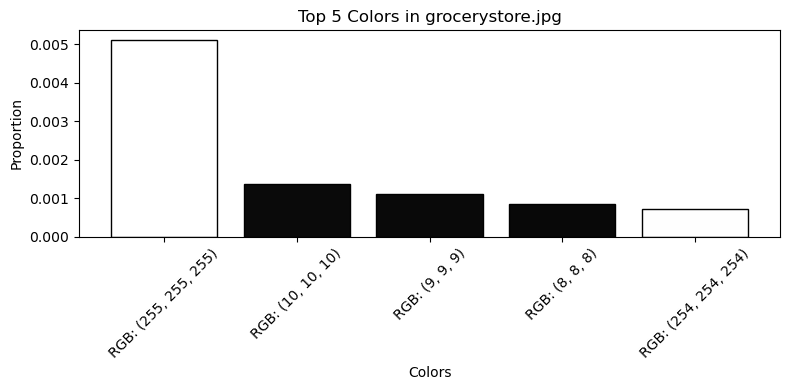

Top Colors for Grocery Store: [(255, 255, 255), (10, 10, 10), (9, 9, 9), (8, 8, 8), (254, 254, 254)]
Extracting dominant colors for: Barber Shop


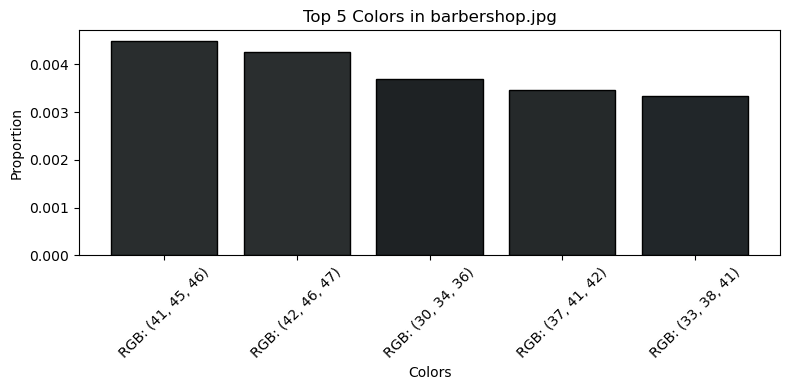

Top Colors for Barber Shop: [(41, 45, 46), (42, 46, 47), (30, 34, 36), (37, 41, 42), (33, 38, 41)]
Extracting dominant colors for: Airport


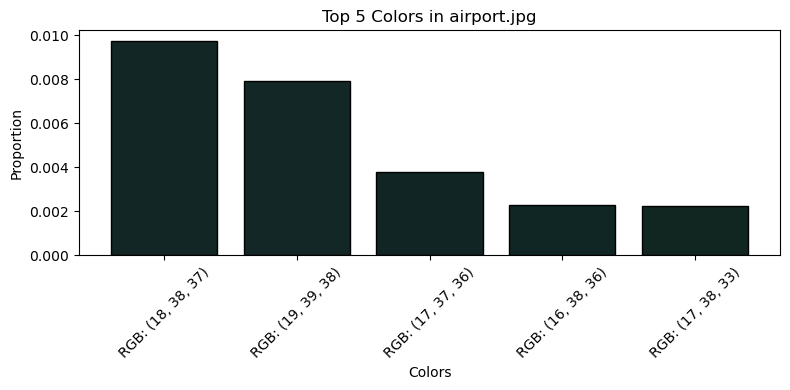

Top Colors for Airport: [(18, 38, 37), (19, 39, 38), (17, 37, 36), (16, 38, 36), (17, 38, 33)]
Extracting dominant colors for: Gym


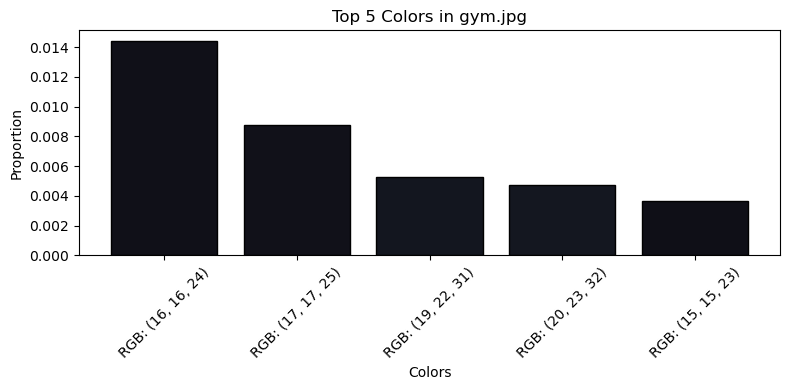

Top Colors for Gym: [(16, 16, 24), (17, 17, 25), (19, 22, 31), (20, 23, 32), (15, 15, 23)]
Extracting dominant colors for: Microsoft Store


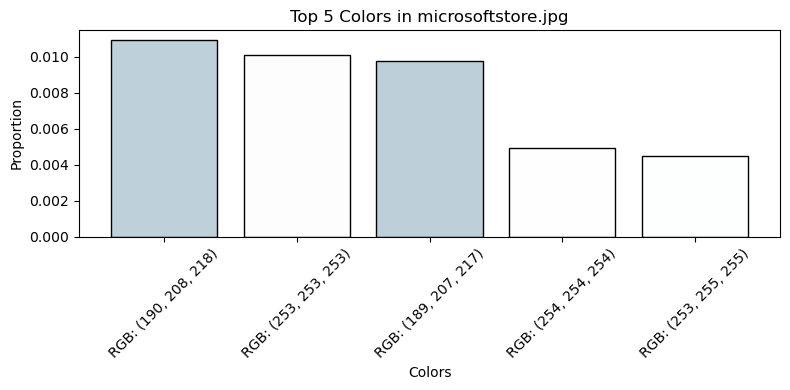

Top Colors for Microsoft Store: [(190, 208, 218), (253, 253, 253), (189, 207, 217), (254, 254, 254), (253, 255, 255)]
Extracting dominant colors for: Art Studio


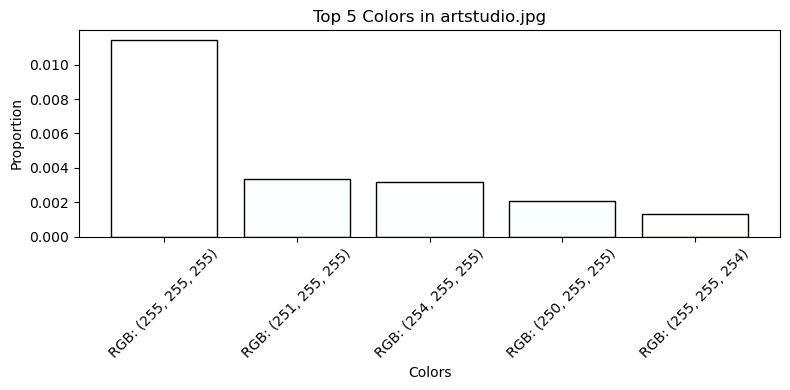

Top Colors for Art Studio: [(255, 255, 255), (251, 255, 255), (254, 255, 255), (250, 255, 255), (255, 255, 254)]
Extracting dominant colors for: Car Dealership


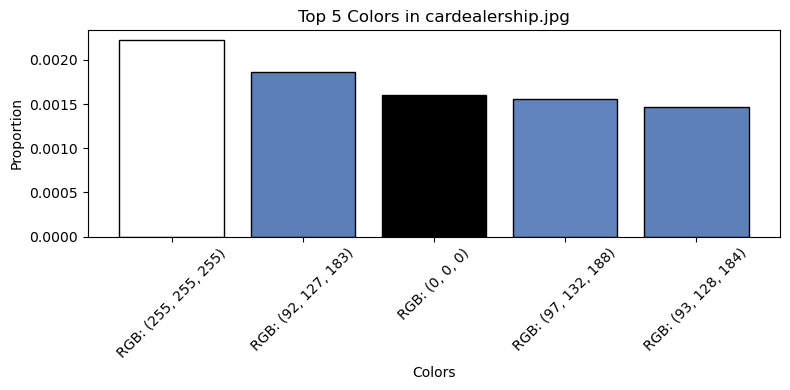

Top Colors for Car Dealership: [(255, 255, 255), (92, 127, 183), (0, 0, 0), (97, 132, 188), (93, 128, 184)]
Extracting dominant colors for: Food Court


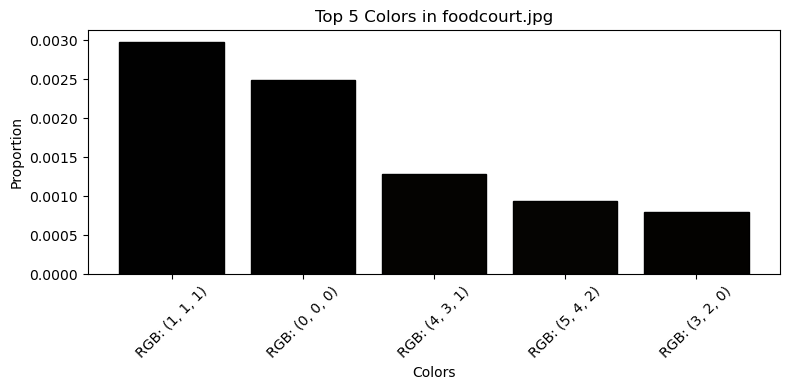

Top Colors for Food Court: [(1, 1, 1), (0, 0, 0), (4, 3, 1), (5, 4, 2), (3, 2, 0)]
Extracting dominant colors for: Factory


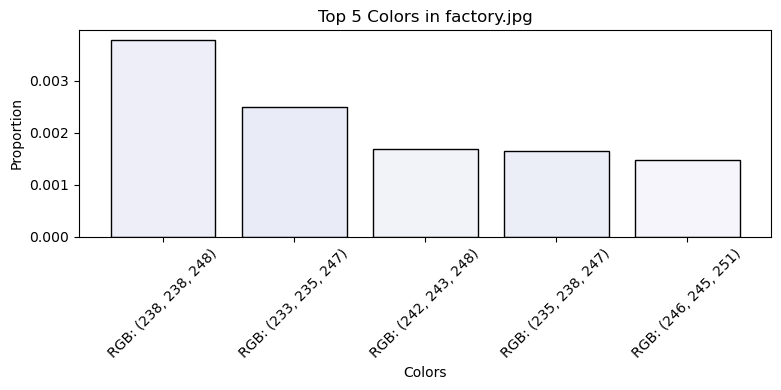

Top Colors for Factory: [(238, 238, 248), (233, 235, 247), (242, 243, 248), (235, 238, 247), (246, 245, 251)]
Extracting dominant colors for: Gas Station


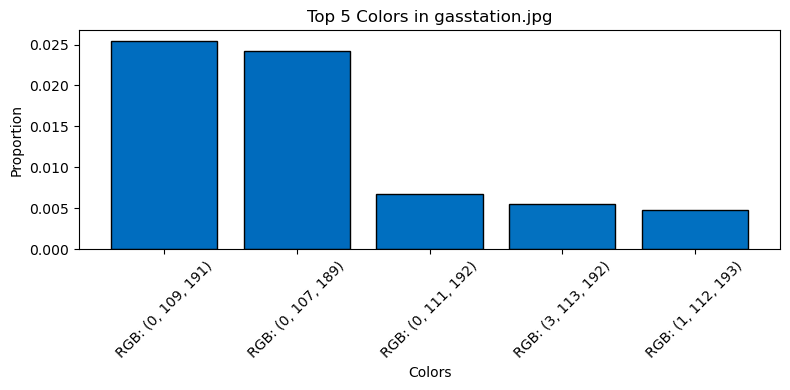

Top Colors for Gas Station: [(0, 109, 191), (0, 107, 189), (0, 111, 192), (3, 113, 192), (1, 112, 193)]


In [9]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

def extract_dominant_colors(image_path, top_n=5):
    """
    Extract the most frequent colors from an image.
    
    Parameters:
    - image_path: Path to the image
    - top_n: Number of dominant colors to extract
    
    Returns:
    - List of dominant colors in RGB format
    """
    # Open and resize the image to reduce computation
    image = Image.open(image_path).resize((150, 150))
    image_array = np.array(image)

    # Flatten the image array to a list of RGB tuples
    pixels = image_array.reshape(-1, 3)
    pixels = [tuple(pixel) for pixel in pixels]  # Convert to tuples for counting

    # Count the frequency of each color
    color_counts = Counter(pixels)
    most_common_colors = color_counts.most_common(top_n)  # Get the top N most common colors

    # Extract the colors and their proportions
    colors = [color for color, count in most_common_colors]
    proportions = [count / len(pixels) for _, count in most_common_colors]

    # Plot the dominant colors
    plt.figure(figsize=(8, 4))
    plt.title(f"Top {top_n} Colors in {image_path.split('/')[-1]}")
    for i, (color, proportion) in enumerate(zip(colors, proportions)):
        plt.bar(i, proportion, color=np.array(color) / 255, edgecolor="black")
    plt.xticks(range(top_n), [f"RGB: {color}" for color in colors], rotation=45)
    plt.ylabel("Proportion")
    plt.xlabel("Colors")
    plt.tight_layout()
    plt.show()

    return colors

# Analyze each image
for name, path in image_paths.items():
    print(f"Extracting dominant colors for: {name}")
    dominant_colors = extract_dominant_colors(path, top_n=5)
    print(f"Top Colors for {name}: {dominant_colors}")
